# Import libraries

In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import hvplot.pandas  
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split  
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix  
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression  
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

# Reading the data 

In [2]:
df=pd.read_csv("fire_Detection.csv")

In [3]:
df

,day,month,year,Temperature,Relative_humidity,Wind_speed,Rain,Fine_Fuel_Moisture_Code,Duff_Moisture_Code,Drought_Code,Initial_Spread_Index,Buildup_Index,Fire_Weather_Index,LABEL
0,6,7,2012,35,42,15,0.3,84.7,15.5,45.1,4.3,16.7,6.3,1.0
1,12,8,2012,35,51,13,0.3,81.3,15.6,75.1,2.5,20.7,4.2,0.0
2,27,6,2012,34,53,18,0.0,89.0,21.6,80.3,9.2,25.8,15.0,1.0
3,18,7,2012,31,68,14,0.0,85.4,12.1,43.1,4.6,14.2,6.0,1.0
4,25,7,2012,39,64,9,1.2,73.8,11.7,15.9,1.1,11.4,0.7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,16,8,2012,36,61,18,0.3,80.2,11.7,90.4,2.8,17.6,4.2,1.0
192,10,8,2012,39,39,15,0.2,89.3,15.8,35.4,8.2,15.8,10.7,1.0
193,4,7,2012,34,58,18,0.0,88.0,13.6,36.8,8.0,14.1,9.9,1.0
194,14,7,2012,34,61,13,0.6,73.9,7.8,22.9,1.4,8.4,0.8,0.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 196 entries, 0 to 195

Data columns (total 14 columns):

 #   Column                   Non-Null Count  Dtype  

---  ------                   --------------  -----  

 0   day                      196 non-null    int64  

 1   month                    196 non-null    int64  

 2   year                     196 non-null    int64  

 3   Temperature              196 non-null    int64  

 4    Relative_humidity       196 non-null    int64  

 5    Wind_speed              196 non-null    int64  

 6   Rain                     196 non-null    float64

 7   Fine_Fuel_Moisture_Code  196 non-null    float64

 8   Duff_Moisture_Code       196 non-null    float64

 9   Drought_Code             196 non-null    object 

 10  Initial_Spread_Index     196 non-null    float64

 11  Buildup_Index            196 non-null    float64

 12  Fire_Weather_Index       196 non-null    float64

 13  LABEL                    195 non-null    float64

dtypes: floa

In [5]:
df.shape

(196, 14)

### EDA Techniques

In [6]:
df.isnull().sum()

day                        0
month                      0
year                       0
Temperature                0
 Relative_humidity         0
 Wind_speed                0
Rain                       0
Fine_Fuel_Moisture_Code    0
Duff_Moisture_Code         0
Drought_Code               0
Initial_Spread_Index       0
Buildup_Index              0
Fire_Weather_Index         0
LABEL                      1
dtype: int64

In [7]:
df.dropna(inplace=True)

In [8]:
df.isnull().sum().sum()

0

In [92]:
df.duplicated().sum()

0

In [93]:
df["Drought_Code"] =  pd.to_numeric(df["Drought_Code"], errors='coerce')

In [94]:
df.info(())

<class 'pandas.core.frame.DataFrame'>

Int64Index: 195 entries, 0 to 195

Data columns (total 14 columns):

 #   Column                   Non-Null Count  Dtype  

---  ------                   --------------  -----  

 0   day                      195 non-null    int64  

 1   month                    195 non-null    int64  

 2   year                     195 non-null    int64  

 3   Temperature              195 non-null    int64  

 4    Relative_humidity       195 non-null    int64  

 5    Wind_speed              195 non-null    int64  

 6   Rain                     195 non-null    float64

 7   Fine_Fuel_Moisture_Code  195 non-null    float64

 8   Duff_Moisture_Code       195 non-null    float64

 9   Drought_Code             195 non-null    float64

 10  Initial_Spread_Index     195 non-null    float64

 11  Buildup_Index            195 non-null    float64

 12  Fire_Weather_Index       195 non-null    float64

 13  LABEL                    195 non-null    float64

dtypes: floa

In [95]:
for column in df.columns:
    print(f"{column}: Number of unique values {df[column].nunique()}")
    print("**********************************************************")

day: Number of unique values 31

**********************************************************

month: Number of unique values 4

**********************************************************

year: Number of unique values 1

**********************************************************

Temperature: Number of unique values 19

**********************************************************

 Relative_humidity: Number of unique values 60

**********************************************************

 Wind_speed: Number of unique values 17

**********************************************************

Rain : Number of unique values 34

**********************************************************

Fine_Fuel_Moisture_Code: Number of unique values 146

**********************************************************

Duff_Moisture_Code: Number of unique values 142

**********************************************************

Drought_Code: Number of unique values 164

*************************************************

In [9]:
df.describe()

,day,month,year,Temperature,Relative_humidity,Wind_speed,Rain,Fine_Fuel_Moisture_Code,Duff_Moisture_Code,Initial_Spread_Index,Buildup_Index,Fire_Weather_Index,LABEL
count,195.000000,195.000000,195.0,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,16.348718,7.425641,2012.0,32.266667,61.979487,15.682051,0.734872,78.120513,15.276923,4.928205,17.305128,7.382564,0.574359
std,8.682928,1.088060,0.0,3.645456,14.906914,2.877470,2.018552,14.472202,12.635106,4.249351,14.397106,7.580041,0.495713
min,1.000000,6.000000,2012.0,22.000000,21.000000,6.000000,0.000000,28.600000,0.900000,0.000000,1.400000,0.000000,0.000000
25%,9.000000,6.000000,2012.0,30.000000,53.000000,14.000000,0.000000,73.300000,6.400000,1.500000,6.650000,0.800000,0.000000
50%,16.000000,7.000000,2012.0,32.000000,63.000000,15.000000,0.000000,84.000000,12.000000,3.800000,13.100000,4.900000,1.000000
75%,24.000000,8.000000,2012.0,35.000000,74.000000,17.500000,0.400000,88.600000,21.100000,7.500000,23.650000,12.150000,1.000000
max,31.000000,9.000000,2012.0,42.000000,90.000000,29.000000,16.800000,96.000000,65.900000,19.000000,68.000000,31.100000,1.000000


In [96]:
for col in df.columns:
    print( col,':', df[col].nunique() )#Num of unique values
    print(df[col].value_counts().nlargest(5)) #Most 5 frequent values
    print('\n' + '*' * 20 + '\n')

day : 31

9     8

27    8

11    8

21    8

3     8

Name: day, dtype: int64



********************



month : 4

7    53

8    51

6    50

9    41

Name: month, dtype: int64



********************



year : 1

2012    195

Name: year, dtype: int64



********************



Temperature : 19

35    22

31    21

34    20

30    19

36    19

Name: Temperature, dtype: int64



********************



 Relative_humidity : 60

55    8

58    8

64    8

66    7

80    7

Name:  Relative_humidity, dtype: int64



********************



 Wind_speed : 17

15    35

14    35

18    22

13    21

17    21

Name:  Wind_speed, dtype: int64



********************



Rain  : 34

0.00    108

0.10     14

0.20     10

0.30      8

0.40      7

Name: Rain , dtype: int64



********************



Fine_Fuel_Moisture_Code : 146

89.40    5

89.30    4

88.90    4

85.40    4

47.40    3

Name: Fine_Fuel_Moisture_Code, dtype: int64



********************



Duff_Moisture_Code : 142

12.50    4


In [97]:
for i in df.columns:
    print(i,':')
    print('Unique Values:', df[i].unique())
    print('Value Counts:')
    print(df[i].value_counts())
    print('\n')

day :

Unique Values: [ 6 12 27 18 25 21  5 16  9 24 31 28  2 13 11 22 20  1 26 29  3 15  4 30

  8 10 23 17 14 19  7]

Value Counts:

9     8

27    8

11    8

21    8

3     8

28    8

15    7

12    7

14    7

22    7

23    7

16    7

4     7

25    7

18    7

26    7

29    6

30    6

20    6

13    6

24    6

19    6

8     5

17    5

6     5

1     5

5     5

7     5

10    4

2     4

31    3

Name: day, dtype: int64





month :

Unique Values: [7 8 6 9]

Value Counts:

7    53

8    51

6    50

9    41

Name: month, dtype: int64





year :

Unique Values: [2012]

Value Counts:

2012    195

Name: year, dtype: int64





Temperature :

Unique Values: [35 34 31 39 36 33 40 26 37 32 30 25 28 27 29 24 42 38 22]

Value Counts:

35    22

31    21

34    20

30    19

36    19

33    17

32    15

29    13

28    12

27     7

37     6

39     6

26     5

25     4

40     3

24     2

38     2

42     1

22     1

Name: Temperature, dtype: int64





 Relative_humidity 

Countplot for: day


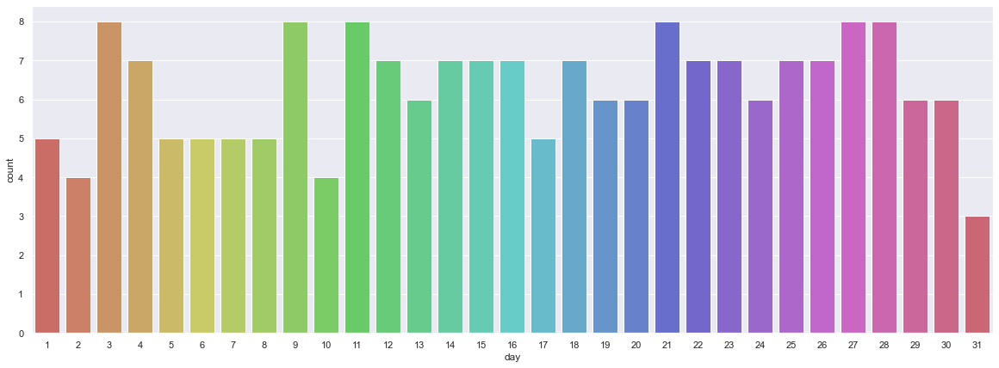





Countplot for: month


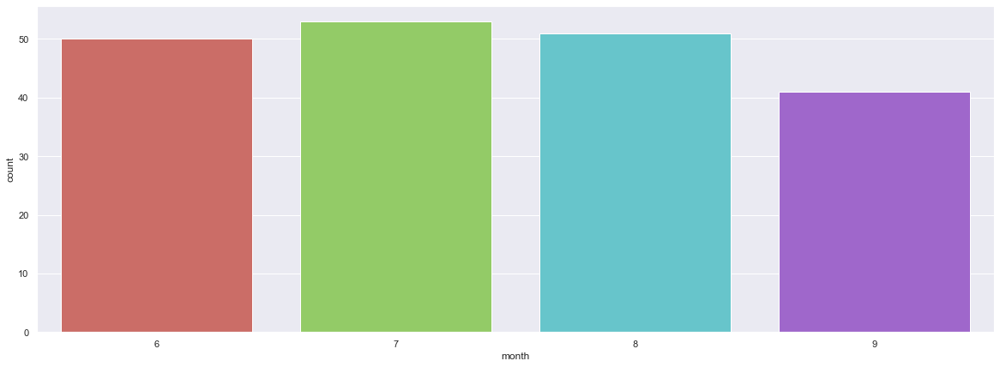





Countplot for: year


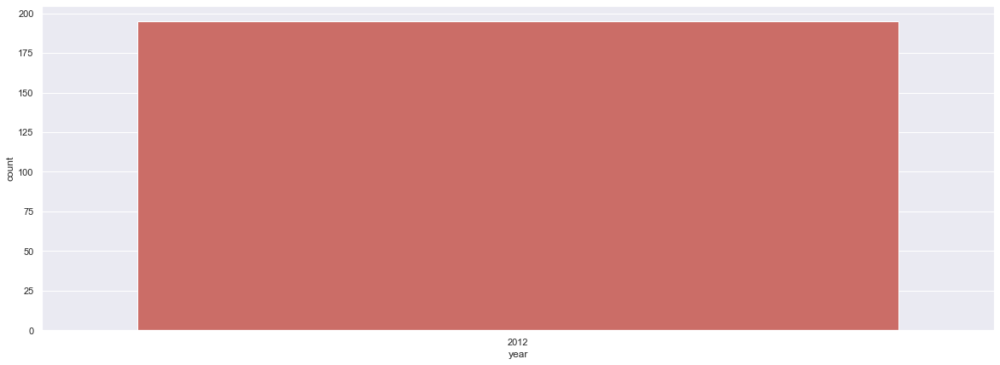





Countplot for: Temperature


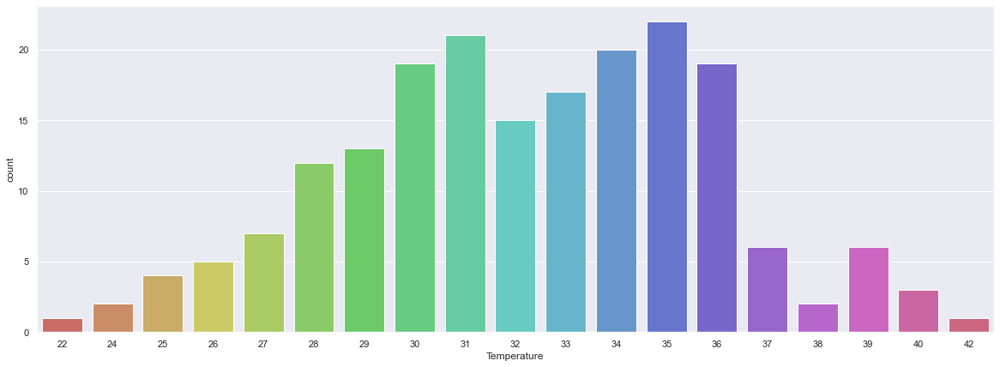





Countplot for:  Relative_humidity


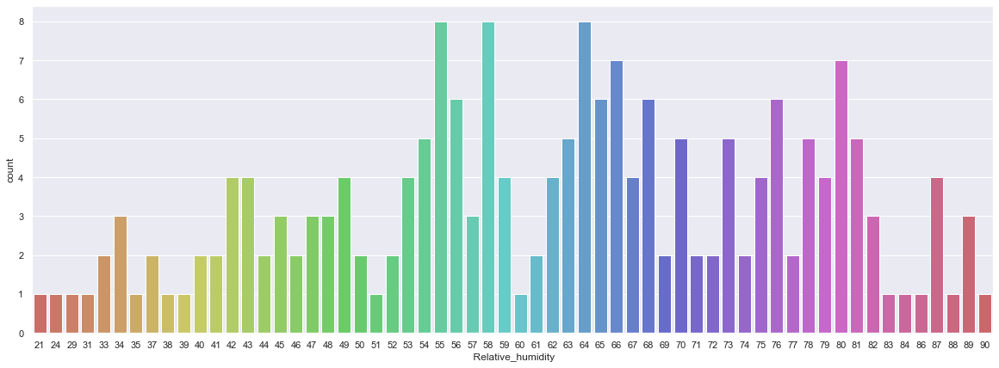





Countplot for:  Wind_speed


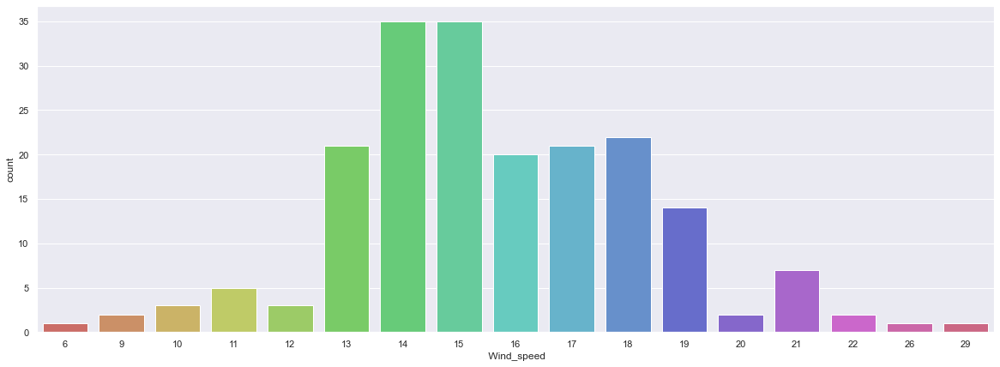





Countplot for: Rain 


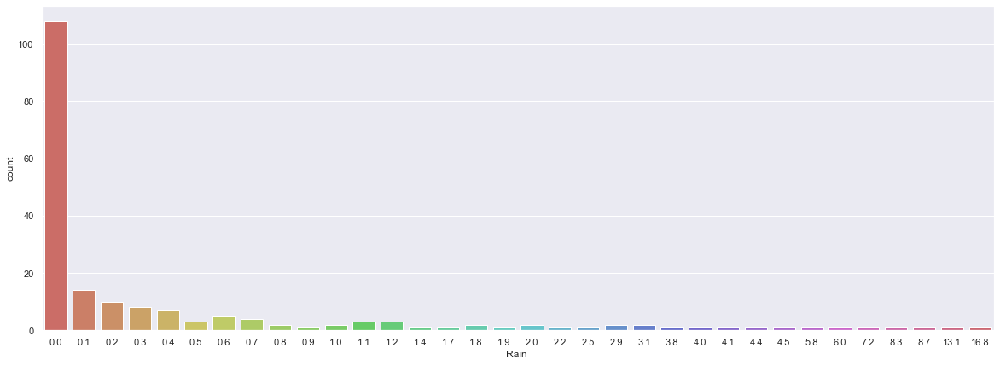





Countplot for: Fine_Fuel_Moisture_Code


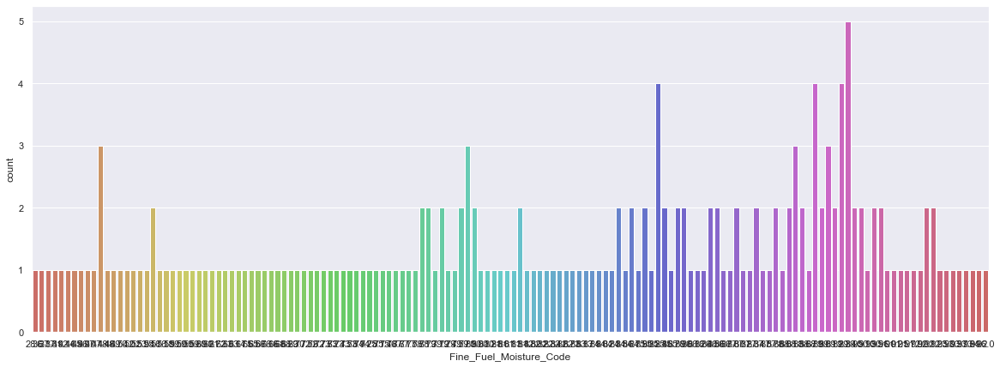





Countplot for: Duff_Moisture_Code


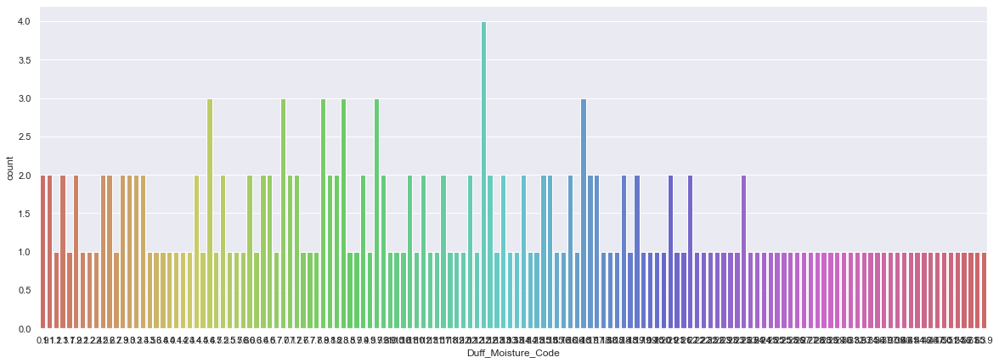





Countplot for: Drought_Code


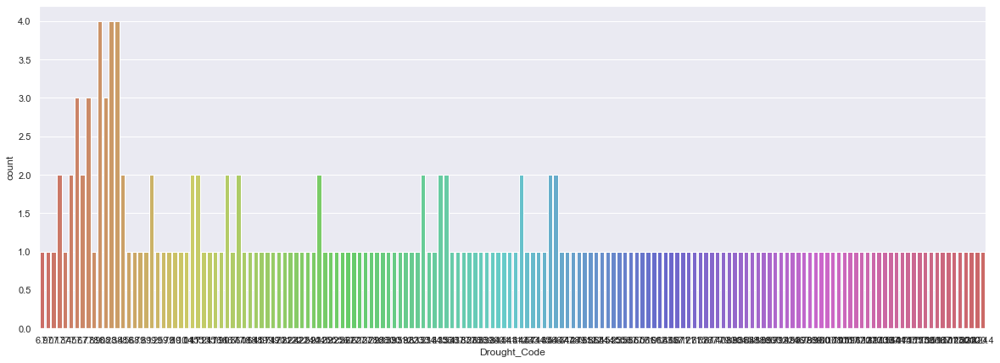





Countplot for: Initial_Spread_Index


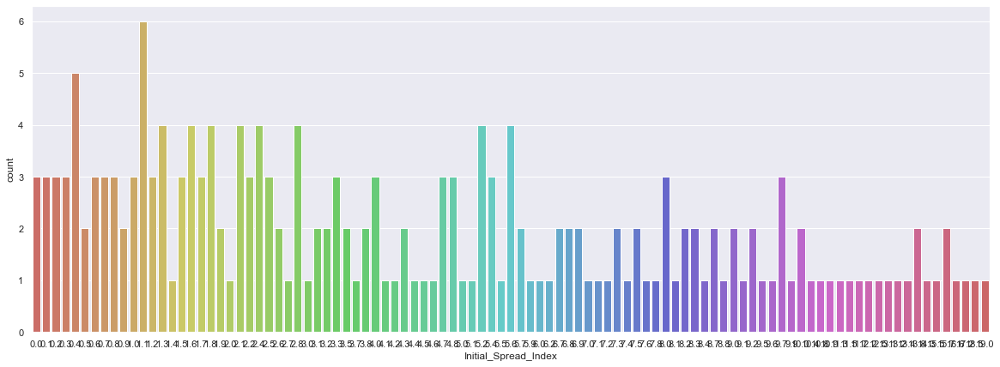





Countplot for: Buildup_Index


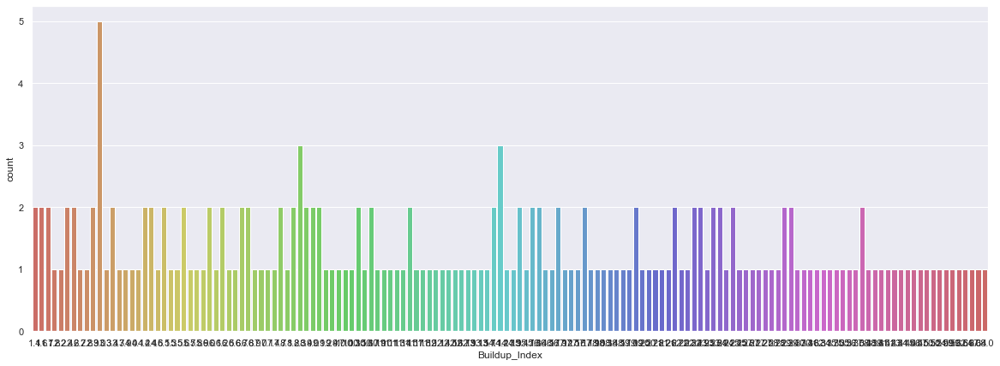





Countplot for: Fire_Weather_Index


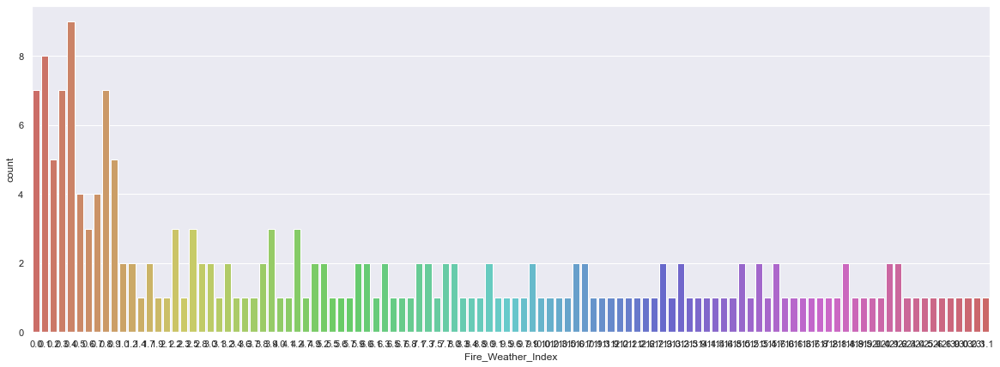





Countplot for: LABEL


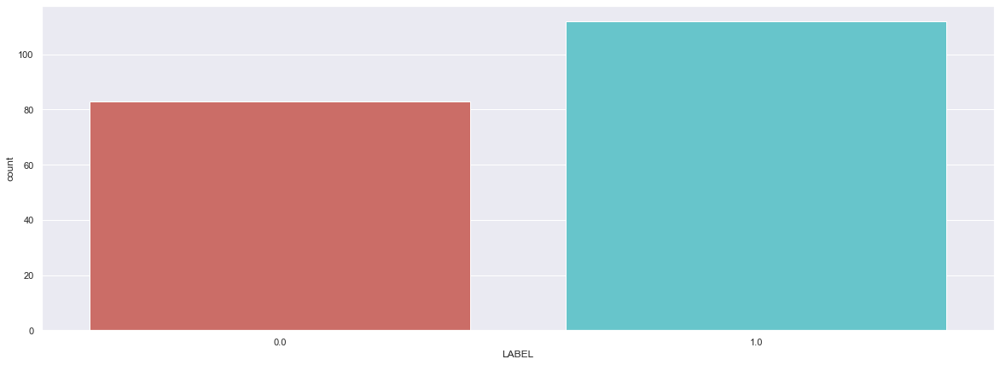

In [98]:
for i in df.columns:
    plt.figure(figsize=[20,7])
    print('Countplot for:', i)
    sns.countplot(df[i], data = df, palette = 'hls')
    plt.xticks(rotation = 0)
    plt.show()
    print('\n')

Pieplot for: day


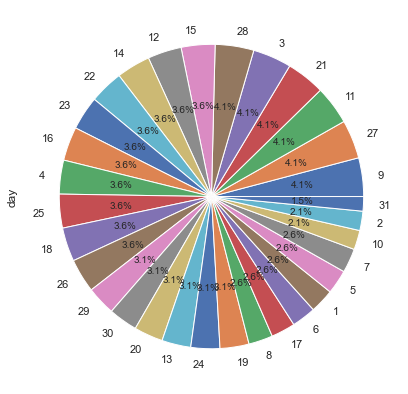





Pieplot for: month


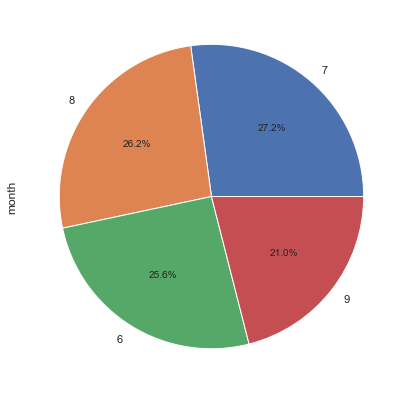





Pieplot for: year


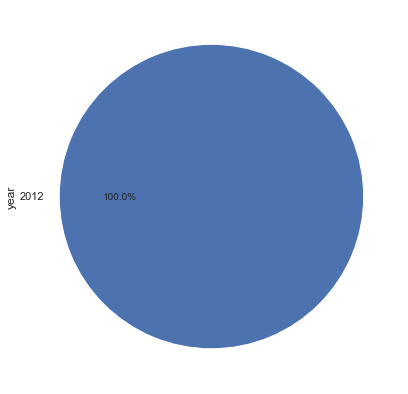





Pieplot for: Temperature


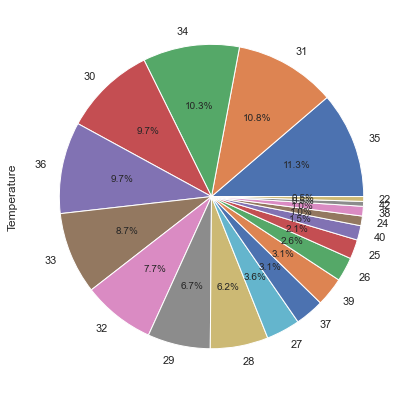





Pieplot for:  Relative_humidity


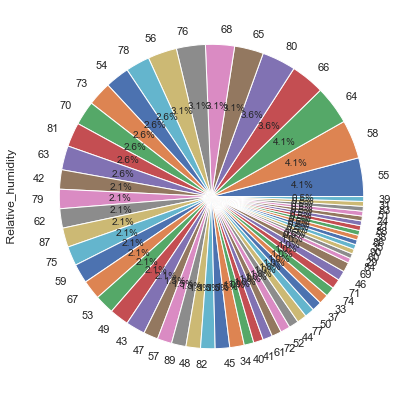





Pieplot for:  Wind_speed


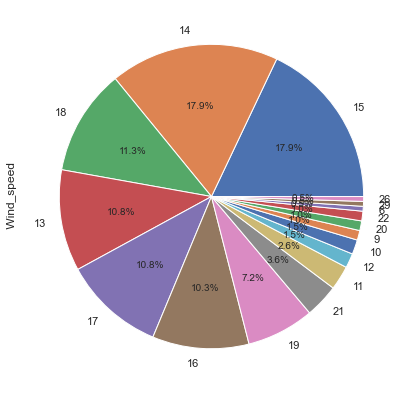





Pieplot for: Rain 


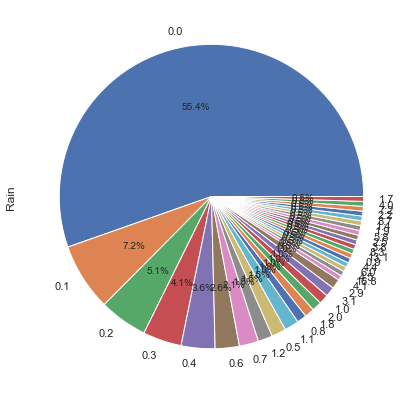





Pieplot for: Fine_Fuel_Moisture_Code


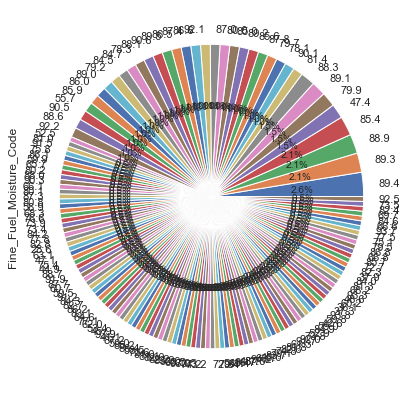





Pieplot for: Duff_Moisture_Code


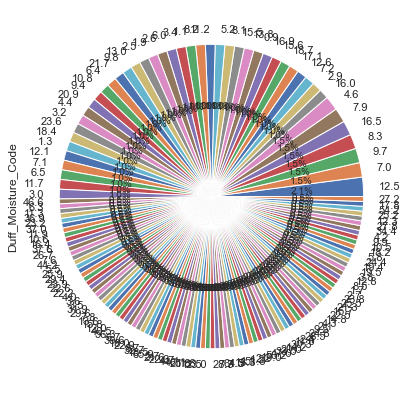





Pieplot for: Drought_Code


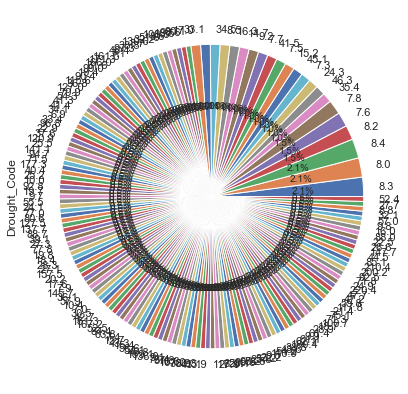





Pieplot for: Initial_Spread_Index


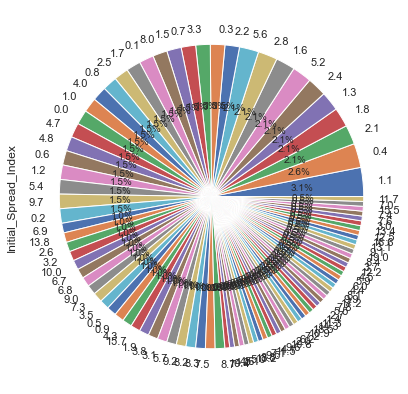





Pieplot for: Buildup_Index


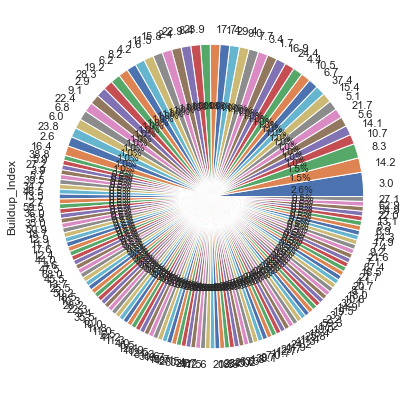





Pieplot for: Fire_Weather_Index


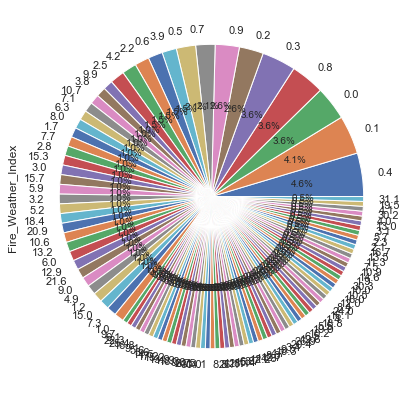





Pieplot for: LABEL


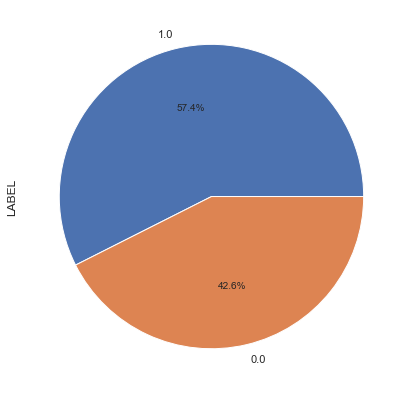

In [99]:
for i in df.columns:
    plt.figure(figsize=[15,7],)
    print('Pieplot for:', i)
    df[i].value_counts().plot(kind='pie',autopct='%1.1f%%')
    plt.show()
    print('\n')

<AxesSubplot:>

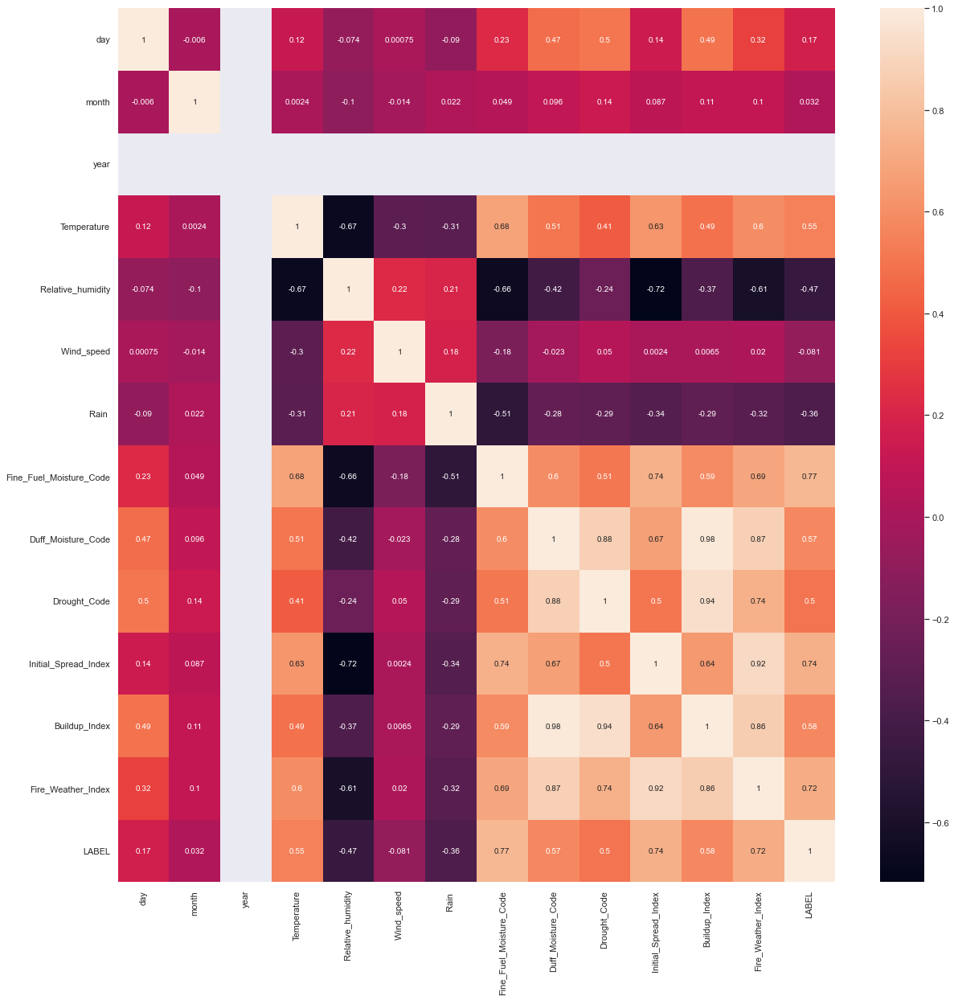

In [101]:
%matplotlib inline
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True)

In [102]:
df=df.drop("year",axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>

Int64Index: 195 entries, 0 to 195

Data columns (total 13 columns):

 #   Column                   Non-Null Count  Dtype  

---  ------                   --------------  -----  

 0   day                      195 non-null    int64  

 1   month                    195 non-null    int64  

 2   Temperature              195 non-null    int64  

 3    Relative_humidity       195 non-null    int64  

 4    Wind_speed              195 non-null    int64  

 5   Rain                     195 non-null    float64

 6   Fine_Fuel_Moisture_Code  195 non-null    float64

 7   Duff_Moisture_Code       195 non-null    float64

 8   Drought_Code             195 non-null    float64

 9   Initial_Spread_Index     195 non-null    float64

 10  Buildup_Index            195 non-null    float64

 11  Fire_Weather_Index       195 non-null    float64

 12  LABEL                    195 non-null    float64

dtypes: float64(8), int64(5)

memory usage: 21.3 KB


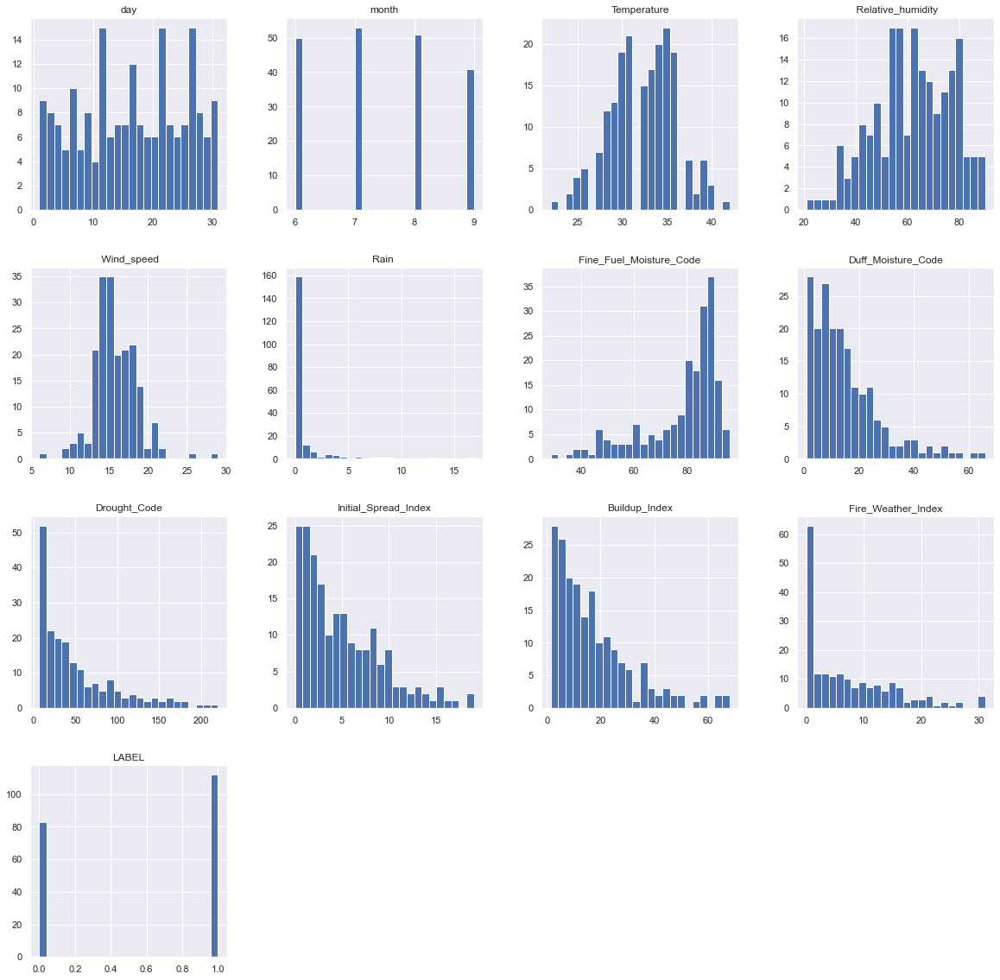

In [103]:
hist = df.hist(bins=24, figsize=(20,20) )

In [104]:
df.dtypes

day                          int64
month                        int64
Temperature                  int64
 Relative_humidity           int64
 Wind_speed                  int64
Rain                       float64
Fine_Fuel_Moisture_Code    float64
Duff_Moisture_Code         float64
Drought_Code               float64
Initial_Spread_Index       float64
Buildup_Index              float64
Fire_Weather_Index         float64
LABEL                      float64
dtype: object

<AxesSubplot:title={'center':'Classes'}, xlabel='Temperature', ylabel='count'>

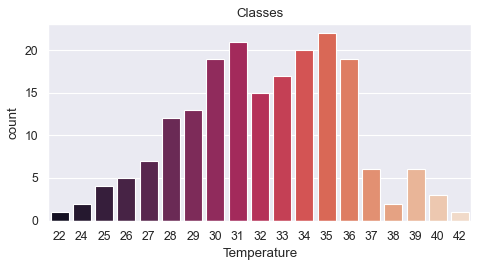

In [105]:
plt.figure(figsize=(15,15),dpi=80)
plt.subplot(4,2,3)
plt.title('Classes')
sns.countplot(x='Temperature',data=df,palette='rocket')

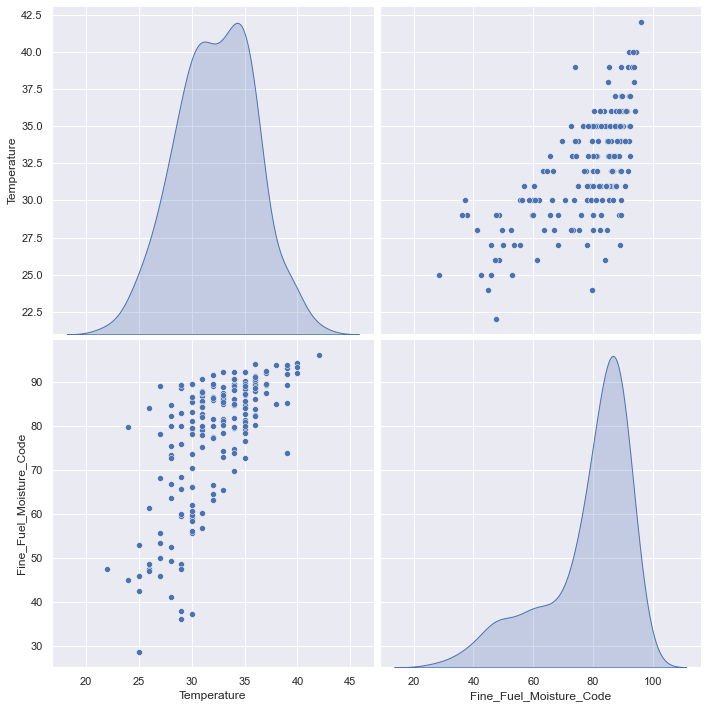

In [106]:
sns.set()
columns = ['Temperature','Fine_Fuel_Moisture_Code',]
sns.pairplot(df[columns],size = 5 ,kind ='scatter',diag_kind='kde')
plt.show()

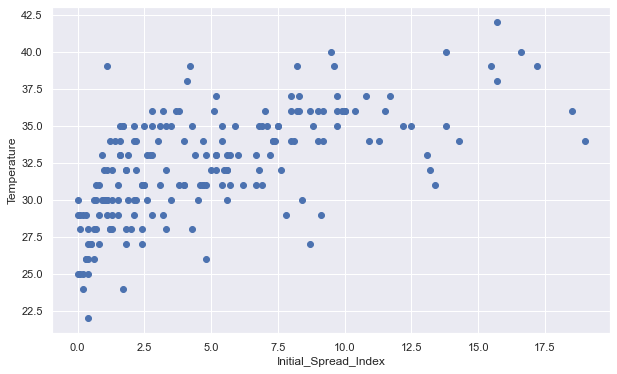

In [107]:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df['Initial_Spread_Index'], df['Temperature'])
ax.set_xlabel('Initial_Spread_Index')
ax.set_ylabel('Temperature')
plt.show()

<AxesSubplot:xlabel='Temperature'>

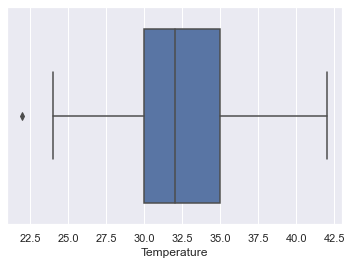

In [108]:
sns.boxplot(x=df['Temperature'])

,day,month,Temperature,Relative_humidity,Wind_speed,Rain,Fine_Fuel_Moisture_Code,Duff_Moisture_Code,Drought_Code,Initial_Spread_Index,Buildup_Index,Fire_Weather_Index,LABEL
day,1.00,-0.01,0.12,-0.07,0.00,-0.09,0.23,0.47,0.50,0.14,0.49,0.32,0.17
month,-0.01,1.00,0.00,-0.10,-0.01,0.02,0.05,0.10,0.14,0.09,0.11,0.10,0.03
Temperature,0.12,0.00,1.00,-0.67,-0.30,-0.31,0.68,0.51,0.41,0.63,0.49,0.60,0.55
Relative_humidity,-0.07,-0.10,-0.67,1.00,0.22,0.21,-0.66,-0.42,-0.24,-0.72,-0.37,-0.61,-0.47
Wind_speed,0.00,-0.01,-0.30,0.22,1.00,0.18,-0.18,-0.02,0.05,0.00,0.01,0.02,-0.08
Rain,-0.09,0.02,-0.31,0.21,0.18,1.00,-0.51,-0.28,-0.29,-0.34,-0.29,-0.32,-0.36
Fine_Fuel_Moisture_Code,0.23,0.05,0.68,-0.66,-0.18,-0.51,1.00,0.60,0.51,0.74,0.59,0.69,0.77
Duff_Moisture_Code,0.47,0.10,0.51,-0.42,-0.02,-0.28,0.60,1.00,0.88,0.67,0.98,0.87,0.57
Drought_Code,0.50,0.14,0.41,-0.24,0.05,-0.29,0.51,0.88,1.00,0.50,0.94,0.74,0.50
Initial_Spread_Index,0.14,0.09,0.63,-0.72,0.00,-0.34,0.74,0.67,0.50,1.00,0.64,0.92,0.74


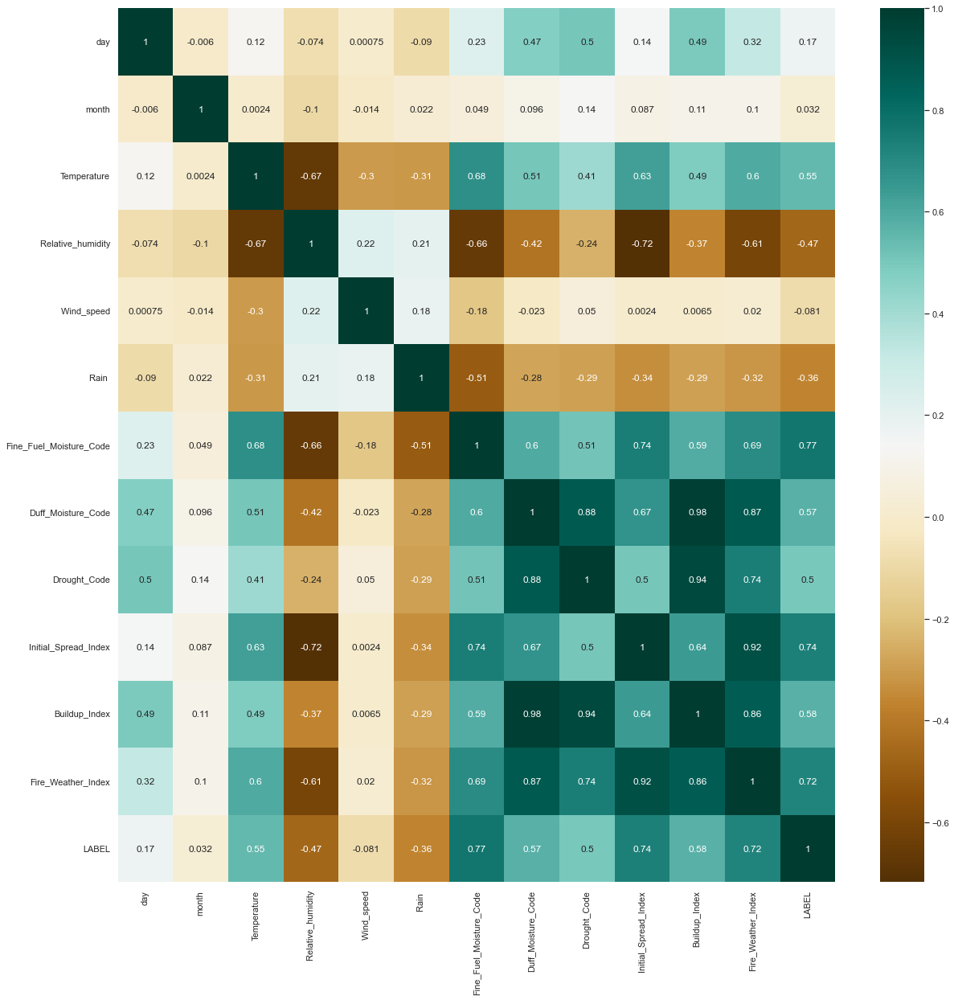

In [109]:
plt.figure(figsize=(20,20))
c= df.corr()
sns.heatmap(c,cmap="BrBG",annot=True)
c

<AxesSubplot:xlabel='Temperature', ylabel='Density'>

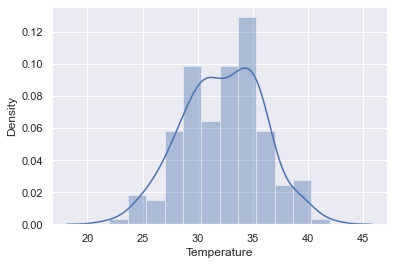

In [110]:
sns.distplot(df['Temperature'])

In [111]:
x=df.drop(df[["LABEL","day","month"]], axis =1)
y=df["LABEL"]

# Some Models on our Data 

In [112]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [113]:
from sklearn.model_selection import cross_val_score
def classify(model, x, y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)
    model.fit(x_train, y_train)
    print("Accuracy is", model.score(x_test, y_test)*100)
    # cross validation - it is used for better validation of model
    # eg: cv-5, train-4, test-1
    score = cross_val_score(model, x, y, cv=5)
    print("Cross validation is",np.mean(score)*100)

In [114]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
classify(model, x, y)

Accuracy is 66.83848328103737

Cross validation is 67.05290544345168


In [115]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
classify(model, x, y)

Accuracy is 97.95918367346938

Cross validation is 95.89743589743588


In [116]:
import xgboost as xgb
model = xgb.XGBRegressor()
classify(model, x, y)

Accuracy is 78.73994873291284

Cross validation is 89.1171962769266


In [117]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier()
classify(model, x, y)

Accuracy is 93.87755102040816

Cross validation is 96.4102564102564


In [118]:

import xgboost as xgb
xgbr = xgb.XGBRegressor(verbosity=0) 
xgbr.fit(x_train, y_train)
y_pred7 = xgbr.predict(x_test)

In [119]:
from sklearn.metrics import accuracy_score
predictions = [round(value) for value in y_pred7]
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 93.22%


In [121]:
model2 = LinearRegression().fit(x_train, y_train)
model2.score(x_train, y_train)
y_pred2 =model2.predict(x_test)

In [122]:
from sklearn.metrics import accuracy_score
predictions = [round(value) for value in y_pred2]
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 96.61%


In [123]:
from lazypredict.Supervised import LazyClassifier

In [124]:
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = clf.fit(x_train, x_test, y_train, y_test)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 24.58it/s]


In [125]:
print(models)

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \

Model                                                                           

LGBMClassifier                     0.97               0.97     0.97      0.97   

XGBClassifier                      0.97               0.97     0.97      0.97   

RandomForestClassifier             0.97               0.97     0.97      0.97   

Perceptron                         0.97               0.97     0.97      0.97   

PassiveAggressiveClassifier        0.97               0.97     0.97      0.97   

BaggingClassifier                  0.97               0.97     0.97      0.97   

LinearDiscriminantAnalysis         0.97               0.96     0.96      0.97   

RidgeClassifierCV                  0.97               0.96     0.96      0.97   

DecisionTreeClassifier             0.97               0.96     0.96      0.97   

RidgeClassifier                    0.97               0.96     0.96      0.97   

AdaBoostClassifi

In [126]:
from lazypredict.Supervised import LazyRegressor


In [127]:
reg = LazyRegressor(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = reg.fit(x_train, x_test, y_train, y_test)

# Print results
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 42/42 [00:04<00:00,  9.13it/s]

                               Adjusted R-Squared  R-Squared  RMSE  Time Taken

Model                                                                         

GradientBoostingRegressor                    0.91       0.92  0.13        0.18

RandomForestRegressor                        0.90       0.92  0.14        0.32

BaggingRegressor                             0.90       0.92  0.14        0.03

HistGradientBoostingRegressor                0.89       0.91  0.15        0.84

LGBMRegressor                                0.89       0.91  0.15        0.07

ExtraTreesRegressor                          0.89       0.91  0.15        0.28

AdaBoostRegressor                            0.82       0.86  0.18        0.08

DecisionTreeRegressor                        0.82       0.86  0.18        0.01

XGBRegressor                                 0.79       0.83  0.20        0.20

ExtraTreeRegressor                           0.65       0.71  0.26        0.01

SVR                                     

## Feature selection Approach 

In [130]:
# Define XGBoost model
model = xgb.XGBClassifier()

# Train model
model.fit(x_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [132]:
importances = pd.Series(model.feature_importances_, index=x_train.columns)
importances = importances.sort_values(ascending=False)
print(importances)

Fine_Fuel_Moisture_Code   0.76

Fire_Weather_Index        0.20

Initial_Spread_Index      0.02

Buildup_Index             0.01

Drought_Code              0.00

Rain                      0.00

Temperature               0.00

 Relative_humidity        0.00

 Wind_speed               0.00

Duff_Moisture_Code        0.00

dtype: float32


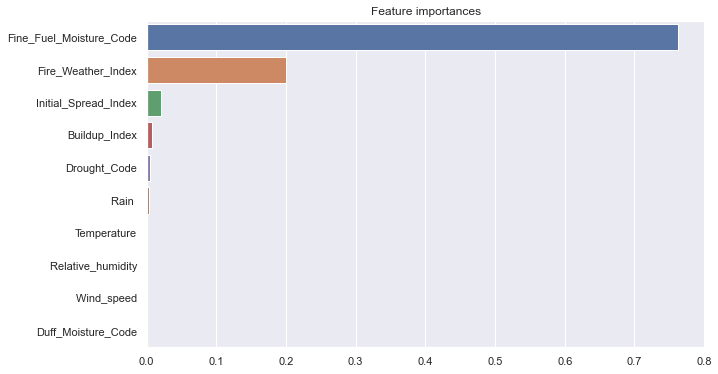

In [133]:
plt.figure(figsize=(10, 6))
sns.barplot(x=importances.values, y=importances.index)
plt.title('Feature importances')
plt.show()

In [134]:
X_after_selection = df[["Fine_Fuel_Moisture_Code","Fire_Weather_Index","Initial_Spread_Index","Buildup_Index"]]

In [139]:
x_train_after_selection, x_test_after_selection, y_train_after_selection, y_test_after_selection = train_test_split(X_after_selection, y, test_size=0.3, random_state=42)

In [140]:
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = clf.fit(x_train_after_selection, x_test_after_selection, y_train_after_selection, y_test_after_selection)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 26.01it/s]


In [141]:
print(models)

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \

Model                                                                           

LGBMClassifier                     0.98               0.99     0.99      0.98   

ExtraTreesClassifier               0.98               0.99     0.99      0.98   

XGBClassifier                      0.98               0.99     0.99      0.98   

DecisionTreeClassifier             0.98               0.99     0.99      0.98   

RandomForestClassifier             0.97               0.97     0.97      0.97   

Perceptron                         0.97               0.97     0.97      0.97   

AdaBoostClassifier                 0.97               0.97     0.97      0.97   

ExtraTreeClassifier                0.97               0.96     0.96      0.97   

BaggingClassifier                  0.95               0.96     0.96      0.95   

QuadraticDiscriminantAnalysis      0.95               0.95     0.95      0.95   

SGDClassifier   

In [142]:
reg = LazyRegressor(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = reg.fit(x_train_after_selection, x_test_after_selection, y_train_after_selection, y_test_after_selection)

# Print results
print(models)

100%|██████████████████████████████████████████████████████████████████████████████████| 42/42 [00:03<00:00, 12.82it/s]

                               Adjusted R-Squared  R-Squared  RMSE  Time Taken

Model                                                                         

GradientBoostingRegressor                    0.97       0.97  0.09        0.06

XGBRegressor                                 0.96       0.96  0.10        0.19

ExtraTreesRegressor                          0.93       0.93  0.13        0.11

DecisionTreeRegressor                        0.92       0.93  0.13        0.02

ExtraTreeRegressor                           0.92       0.93  0.13        0.02

RandomForestRegressor                        0.92       0.92  0.14        0.39

BaggingRegressor                             0.91       0.92  0.14        0.05

LGBMRegressor                                0.91       0.92  0.14        0.13

HistGradientBoostingRegressor                0.90       0.91  0.15        0.22

AdaBoostRegressor                            0.90       0.91  0.15        0.04

KNeighborsRegressor                     

# WAIT!
 This is just the first part of the big project, The project aims to identify the causes of the fires in the forests.
 
 The second part will be a computer vision approach on a real image dataset.